# Research About the dataset


1.   Air Quality Index is a tool for effective communication of air quality status to people in 
terms, which are easy to understand. It transforms complex air quality data of various pollutants into a single number (index value), nomenclature and colour.
2.   There are six AQI categories, namely Good, Satisfactory, Moderately polluted, Poor, Very Poor, and Severe. Each of these categories is decided based on ambient concentration values of air pollutants and their likely health impacts (known as health 
breakpoints). AQ sub-index and health breakpoints are evolved for eight pollutants (PM10, PM2.5, NO2, SO2, CO, O3, NH3, and Pb) for which short-term (upto 24-hours) National Ambient Air Quality Standards are prescribed.











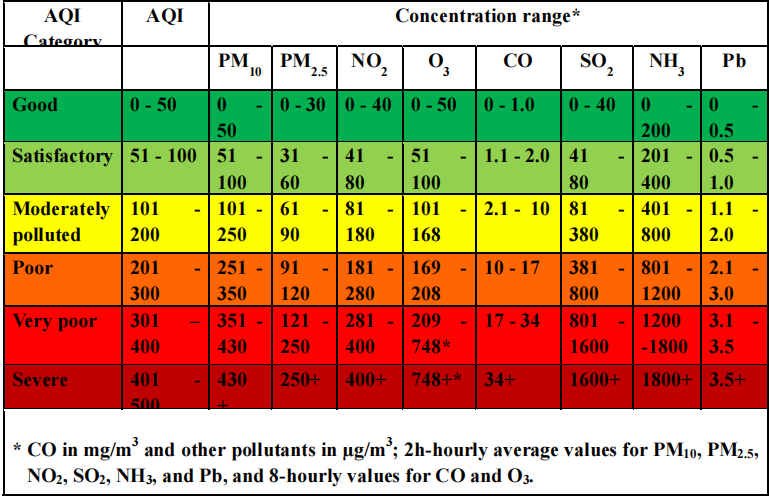


A microgram is expressed as (μg) in usage.On the other hand, the milligram is the long form of the abbreviation “mg.” One mg is equal to 1000 micrograms. This means that a milligram is 1000 times bigger than a microgram.

If in the pollutant value CO is greater than it's range then it will be consider as the major air pollutant for that particular time.




1.   Particles are defined by their diameter for air quality regulatory purposes. Those with a diameter of 10 microns or less (PM10) are inhalable into the lungs and can induce adverse health effects. Fine particulate matter is defined as particles that are 2.5 microns or less in diameter (PM2. 5).

2.   Excess light at night can contribute to air pollution which is lumminace column in the data.


3.  As a sanitation device, UV lights eliminate bacteria and mold around your air conditioning (furnace) coil before it can be recirculated into your living space. Common bioaerosols and airborne pollutants that affect indoor air quality include: Mold, mildew, fungus






# 1. Exploratory Data Assessment 
1) Explore the data visualize the sensor measurements ,plot the distributions, etc. 

I have got data of more than 2L datapoint as the environment i am using is not able to handle this much data so i am perfroming this analysis on only 30K datapoints.

# Exploring the data

In [1]:
import pandas as pd #use for any operation related to files and dataframe
import numpy as np #use for statistics
import matplotlib.pyplot as plt #use for visualization purpose
import seaborn as sns #use for higher visualization
import missingno as msno #used to plot the missing values 

In [2]:
#loading the data set with 30K data points
pollution_data = pd.read_csv("/content/air_pollution_30000_final.csv")

In [3]:
#this function will give no of dimensions/columns and features/rows in the dataset
pollution_data.shape

(31266, 22)

In [4]:
#use to get the column name form the dataset
pollution_data.columns

Index(['primary_key', 'airqualitylevel', 'devicestatus', 'id', 'date',
       'airqualityindex', 'aqimajorpollutant', 'relativehumidity',
       'atmosphericpressure', 'co2', 'pm2p5', 'uv', 'o3', 'airtemperature',
       'no2', 'co', 'pm10', 'illuminance', 'so2', 'ambientnoise', 'time',
       'DateTime'],
      dtype='object')

In [5]:
#it will give first five rows of the dataset/dataframe
pollution_data.head()

,primary_key,airqualitylevel,devicestatus,id,date,airqualityindex,aqimajorpollutant,relativehumidity,atmosphericpressure,co2,...,o3,airtemperature,no2,co,pm10,illuminance,so2,ambientnoise,time,DateTime
0,0ba1a18d-a550-302a-8f03-388e781437a0,MODERATE,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/16/2021,118,CO,72.93,0.93,0.00,...,8.99,27.84,5.18,2.28,81.87,1.52,0.45,77.23,12:11:41 AM,16-11-2021 00:11:41
1,867ba546-fe17-38d2-ad75-881eba2d9b76,MODERATE,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/16/2021,198,PM2.5,70.94,0.93,660.73,...,7.59,26.59,55.52,0.96,142.62,3.90,1.02,74.21,12:11:41 AM,16-11-2021 00:11:41
2,17718df0-d577-3435-906a-889a34eafe68,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/16/2021,95,CO,68.13,0.93,146.92,...,7.85,28.51,71.60,1.44,43.16,1.39,8.19,69.88,12:11:41 AM,16-11-2021 00:11:41
3,1ea4fa60-6c04-360e-b97c-73a6f6734932,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/16/2021,97,CO,63.55,0.93,0.00,...,1.93,28.32,34.51,0.79,25.00,0.17,2.10,102.01,12:11:41 AM,16-11-2021 00:11:41
4,d09fa804-56d6-3339-8dd2-8e7871933738,MODERATE,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/16/2021,103,PM10,76.78,0.93,264.40,...,34.32,26.32,39.51,0.74,55.89,2.67,5.54,65.15,12:11:42 AM,16-11-2021 00:11:42


In [6]:
#it will give last five rows of the dataset/dataframe
pollution_data.tail()

,primary_key,airqualitylevel,devicestatus,id,date,airqualityindex,aqimajorpollutant,relativehumidity,atmosphericpressure,co2,...,o3,airtemperature,no2,co,pm10,illuminance,so2,ambientnoise,time,DateTime
31261,b4407ffe-ede5-319f-a2c6-6fa572f9ca5d,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/24/2021,59,NO2,64.51,0.94,0.00,...,18.73,31.24,40.62,1.03,45.08,32640.72,0.69,81.46,11:41:47 AM,24-11-2021 11:41:47
31262,958d1e7c-5a56-30ad-8bc2-88a3ce1724f5,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/24/2021,84,PM2.5,70.98,0.94,514.92,...,43.06,29.25,24.48,0.81,146.25,430.24,0.32,80.24,11:41:47 AM,24-11-2021 11:41:47
31263,e3a0cf18-ba09-32b7-8619-d1178c60bde7,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/24/2021,88,NO2,62.44,0.93,195.31,...,32.93,31.36,54.94,1.05,24.81,9027.17,5.14,68.83,11:41:47 AM,24-11-2021 11:41:47
31264,09107dad-69c5-3a6d-ad8a-9b900f2bb9a8,GOOD,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/24/2021,44,NO2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11:41:47 AM,24-11-2021 11:41:47
31265,0c5cb4bb-2330-3272-83b5-f91d0ce6ecfc,SATISFACTORY,ACTIVE,datakaveri.org/04a15c9960ffda227e9546f3f46e629...,11/24/2021,93,NO2,69.52,0.94,521.53,...,57.76,29.84,47.32,0.60,82.95,3338.53,0.96,81.56,11:41:47 AM,24-11-2021 11:41:47


In [7]:
#it gives information about the dataset 
pollution_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31266 entries, 0 to 31265
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   primary_key          31266 non-null  object 
 1   airqualitylevel      31266 non-null  object 
 2   devicestatus         31266 non-null  object 
 3   id                   31266 non-null  object 
 4   date                 31266 non-null  object 
 5   airqualityindex      31266 non-null  int64  
 6   aqimajorpollutant    31266 non-null  object 
 7   relativehumidity     26366 non-null  float64
 8   atmosphericpressure  26348 non-null  float64
 9   co2                  25821 non-null  float64
 10  pm2p5                25726 non-null  float64
 11  uv                   25411 non-null  float64
 12  o3                   25411 non-null  float64
 13  airtemperature       25411 non-null  float64
 14  no2                  25404 non-null  float64
 15  co                   25404 non-null 

In [8]:
#use to get the no of number values prsent in the particular column of the dataset
pollution_data.isnull().sum()

primary_key               0
airqualitylevel           0
devicestatus              0
id                        0
date                      0
airqualityindex           0
aqimajorpollutant         0
relativehumidity       4900
atmosphericpressure    4918
co2                    5445
pm2p5                  5540
uv                     5855
o3                     5855
airtemperature         5855
no2                    5862
co                     5862
pm10                   5862
illuminance            5864
so2                    5864
ambientnoise           5864
time                      0
DateTime                  0
dtype: int64

In [9]:
#dropping the unncessary column from the dataset
pollution_data=pollution_data.drop(["primary_key","devicestatus","id"],axis=1)

In [10]:
pollution_data['atmosphericpressure'] = pollution_data['atmosphericpressure'].fillna(pollution_data['atmosphericpressure'].median())
pollution_data['co2'] = pollution_data['co2'].fillna(pollution_data['co2'].mean())
pollution_data['pm2p5'] = pollution_data['pm2p5'].fillna(pollution_data['pm2p5'].mean())
pollution_data['uv'] = pollution_data['uv'].fillna(pollution_data['uv'].mean())
pollution_data['o3'] = pollution_data['o3'].fillna(pollution_data['o3'].median())
pollution_data['airtemperature'] = pollution_data['airtemperature'].fillna(pollution_data['airtemperature'].mean())
pollution_data['no2'] = pollution_data['no2'].fillna(pollution_data['no2'].mean())
pollution_data['co'] = pollution_data['co'].fillna(pollution_data['co'].median())
pollution_data['pm10'] = pollution_data['pm10'].fillna(pollution_data['pm10'].mean())
pollution_data['illuminance'] = pollution_data['illuminance'].fillna(pollution_data['illuminance'].median())
pollution_data['so2'] = pollution_data['so2'].fillna(pollution_data['so2'].mean())
pollution_data['ambientnoise'] = pollution_data['ambientnoise'].fillna(pollution_data['ambientnoise'].mean())
pollution_data['relativehumidity'] = pollution_data['relativehumidity'].fillna(pollution_data['relativehumidity'].median())

In [11]:
#handlling the missing value
#dropping all the rows with have null values
#pollution_data= pollution_data.dropna(subset=['atmosphericpressure', 'co2', 'pm2p5', 'uv', 'o3',
       #'airtemperature', 'no2', 'co', 'pm10', 'illuminance', 'so2',
       #'ambientnoise'])

In [12]:
pollution_data.isnull().sum()

airqualitylevel        0
date                   0
airqualityindex        0
aqimajorpollutant      0
relativehumidity       0
atmosphericpressure    0
co2                    0
pm2p5                  0
uv                     0
o3                     0
airtemperature         0
no2                    0
co                     0
pm10                   0
illuminance            0
so2                    0
ambientnoise           0
time                   0
DateTime               0
dtype: int64

As we can see now there is no null value present in the data.

In [13]:
#It will give all the statistical value of numerical column in the dataset
pollution_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
airqualityindex,31266.0,87.882812,39.809471,22.00,61.00,81.000000,102.000000,289.00
relativehumidity,31266.0,72.977114,9.773518,36.40,67.42,74.590000,79.710000,93.91
atmosphericpressure,31266.0,0.917168,0.074501,0.06,0.93,0.930000,0.930000,1.57
co2,31266.0,224.017369,232.773090,0.00,0.00,224.017369,366.967500,2916.55
pm2p5,31266.0,31.840213,24.106194,0.00,14.81,30.845000,37.830000,264.88
uv,31266.0,0.221453,0.469372,0.00,0.00,0.020000,0.221453,7.31
o3,31266.0,21.491034,16.089573,0.00,11.47,18.660000,27.490000,124.11
airtemperature,31266.0,27.537114,2.587427,8.43,25.54,27.537114,28.700000,49.89
no2,31266.0,43.011652,19.851962,0.00,31.20,43.011652,54.400000,217.03
co,31266.0,1.111208,0.907034,0.09,0.56,0.890000,1.320000,11.17


From this we can check wether our data column have outlier or not for that you just have to look at the mean value of the particular column and the 50% which is the median value if the mean value is less than the median value for the particular column than the column is containing outlier.in this relativehumedity column , atmosphericpressure these two column have value of mean less as compared to median but the difference is very less between these values and there can be conditions where atomspheric pressure,humedity can sudden increase and decrese so ..By this we can say that our data don't have outliers.

In [14]:
#converting the date column datatype from object to datetime
pollution_data['date'] = pd.to_datetime(pollution_data['date'])

In [15]:
#extrcating the year,month,day from date column
pollution_data['year'] = pd.to_datetime(pollution_data['date']).dt.year
pollution_data['month'] = pd.to_datetime(pollution_data['date']).dt.month
pollution_data['day'] = pd.to_datetime(pollution_data['date']).dt.day

In [16]:
pollution_data.head()

,airqualitylevel,date,airqualityindex,aqimajorpollutant,relativehumidity,atmosphericpressure,co2,pm2p5,uv,o3,...,co,pm10,illuminance,so2,ambientnoise,time,DateTime,year,month,day
0,MODERATE,2021-11-16,118,CO,72.93,0.93,0.00,41.29,0.0,8.99,...,2.28,81.87,1.52,0.45,77.23,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
1,MODERATE,2021-11-16,198,PM2.5,70.94,0.93,660.73,88.80,0.0,7.59,...,0.96,142.62,3.90,1.02,74.21,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
2,SATISFACTORY,2021-11-16,95,CO,68.13,0.93,146.92,17.59,0.0,7.85,...,1.44,43.16,1.39,8.19,69.88,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
3,SATISFACTORY,2021-11-16,97,CO,63.55,0.93,0.00,11.32,0.0,1.93,...,0.79,25.00,0.17,2.10,102.01,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
4,MODERATE,2021-11-16,103,PM10,76.78,0.93,264.40,20.71,0.0,34.32,...,0.74,55.89,2.67,5.54,65.15,12:11:42 AM,16-11-2021 00:11:42,2021,11,16


# Visualize the sensor measurements plot the distributions

# Univariate Analysis


In this i am going to analyze every column one by one.


In [17]:
pollution_data.columns

Index(['airqualitylevel', 'date', 'airqualityindex', 'aqimajorpollutant',
       'relativehumidity', 'atmosphericpressure', 'co2', 'pm2p5', 'uv', 'o3',
       'airtemperature', 'no2', 'co', 'pm10', 'illuminance', 'so2',
       'ambientnoise', 'time', 'DateTime', 'year', 'month', 'day'],
      dtype='object')

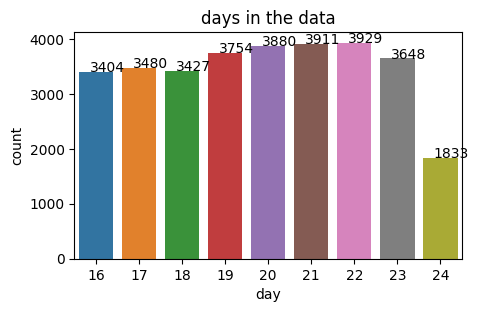

In [18]:
plt.figure(figsize=(5,3),dpi=100)
plt.title('days in the data')
ax = sns.countplot(x=pollution_data['day']);
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

As shown in the above graph the count for 20th day is 3880 and 21st day is 3911 have the highest datapoints in the dataset and the least count day is 24th day.

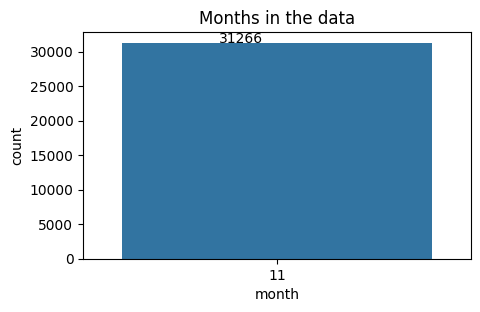

In [19]:
plt.figure(figsize=(5,3),dpi=100)
plt.title('Months in the data')
ax = sns.countplot(x=pollution_data['month']);
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

from above graph we get that we have only 1 month of data which is of month november

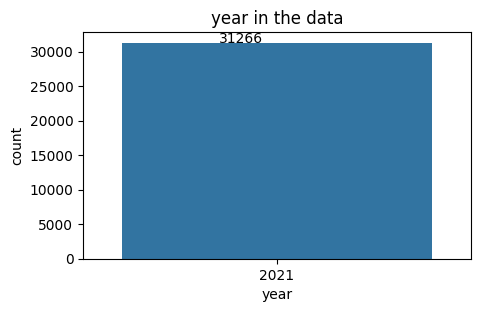

In [20]:
plt.figure(figsize=(5,3),dpi=100)
plt.title('year in the data')
ax = sns.countplot(x=pollution_data['year']);
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

from above graph we get that we have only 1year in that only 1 month of data which is of month november

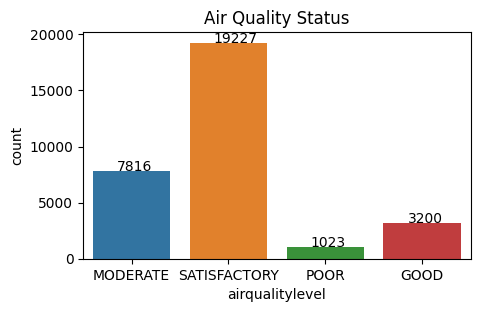

In [21]:
plt.figure(figsize=(5,3),dpi=100)
plt.title('Air Quality Status')
ax = sns.countplot(x=pollution_data['airqualitylevel']);
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

In the 30K datapoint their is no case of very poor and severe .As we can see that satisfactory air quality status got higher no and the least is poor

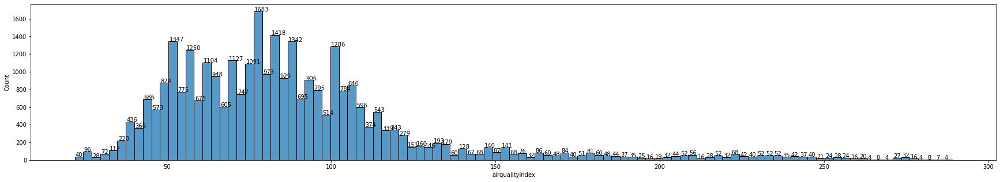

In [22]:
plt.figure(figsize=(30,5))
ax=sns.histplot(x=pollution_data['airqualityindex'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

As we can see that most of the air quality index value lies between 50 to 100 

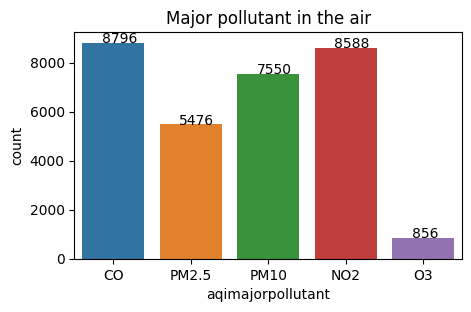

In [23]:
plt.figure(figsize=(5,3),dpi=100)
plt.title('Major pollutant in the air')
ax = sns.countplot(x=pollution_data['aqimajorpollutant']);
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The major air pollutant inthe data is CO than NO2

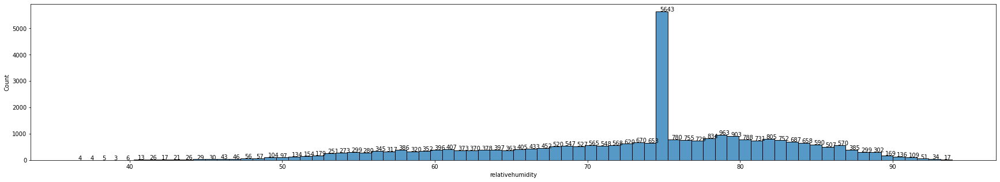

In [24]:
plt.figure(figsize=(30,5))
ax=sns.histplot(x=pollution_data['relativehumidity'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

Most of the relative humadity values lies between 60 to 90 and you can also see count values of the particular range.

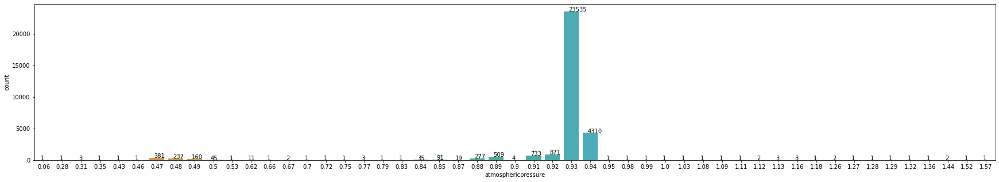

In [25]:
plt.figure(figsize=(30,5))
ax=sns.countplot(x=pollution_data['atmosphericpressure'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The value for the atompheric pressure is 0.93 for most of the data points

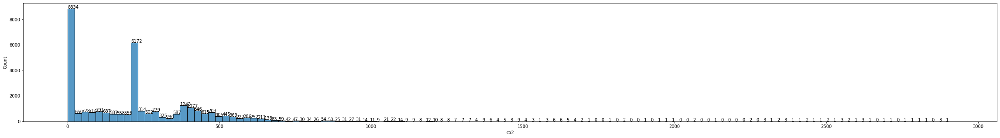

In [26]:
plt.figure(figsize=(40,5))
ax=sns.histplot(x=pollution_data['co2'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The value for the Co2 lies between  0-500 and most of them are 0

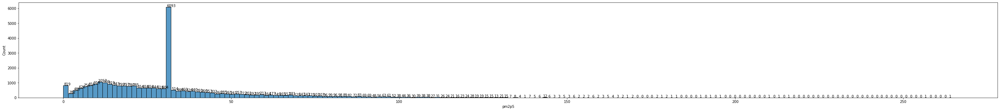

In [27]:
plt.figure(figsize=(50,5))
ax=sns.histplot(x=pollution_data['pm2p5'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The value for the pm2p5 lies between 0-50 

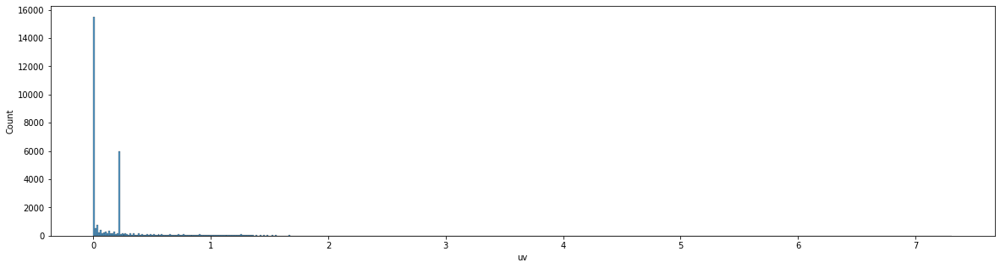

In [28]:
plt.figure(figsize=(20,5))
sns.histplot(x=pollution_data['uv'])
plt.show()

The value for the uv lies between 0-1 and most of them are 0

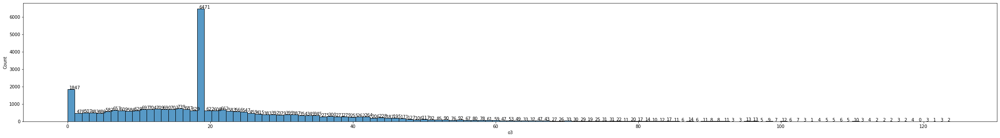

In [29]:
plt.figure(figsize=(40,5))
ax=sns.histplot(x=pollution_data['o3'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The value for the o3 lies between 0-60 and most of them are 0 and then 20 -40

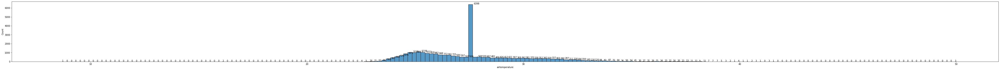

In [30]:
plt.figure(figsize=(80,5))
ax=sns.histplot(x=pollution_data['airtemperature'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The value for the air tempreature lies between 25-30 

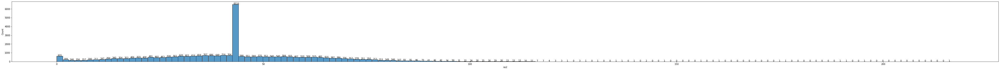

In [31]:
plt.figure(figsize=(80,5))
ax=sns.histplot(x=pollution_data['no2'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

As you can see in the graph that the most of NO2 values les between 0 to 70

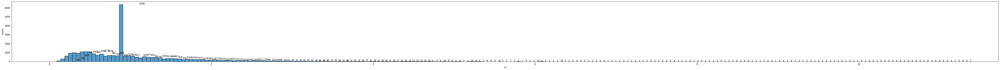

In [32]:
plt.figure(figsize=(80,5))
ax=sns.histplot(x=pollution_data['co'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

As in the graph for CO most of the values lies between 0 to 2

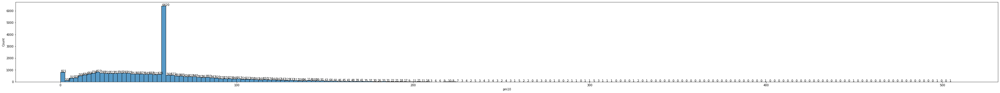

In [33]:
plt.figure(figsize=(60,5))
ax=sns.histplot(x=pollution_data['pm10'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

For PM10 most of the values lies betwwn 0 to 100

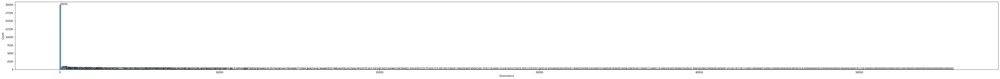

In [34]:
plt.figure(figsize=(70,5))
ax=sns.histplot(x=pollution_data['illuminance'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

For illuminance the value range is 0 to 1000 and in that most of them are 0

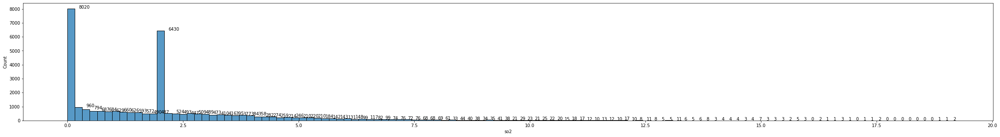

In [35]:
plt.figure(figsize=(40,5))
ax=sns.histplot(x=pollution_data['so2'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

For SO2 most of the values are 0.0 and the value 0.5.

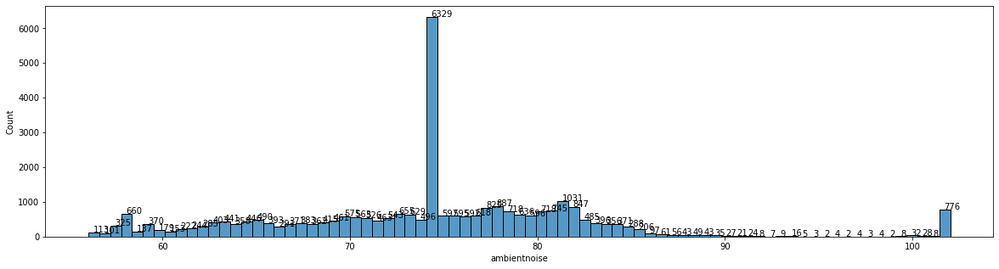

In [36]:
plt.figure(figsize=(20,5))
ax=sns.histplot(x=pollution_data['ambientnoise'])
for p in ax.patches: 
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01)) 
plt.show()

The range for most of the ambientnoice is between 60 to 80

# 2. Correlation - See which sensors show correlating measures over time

# Time plot for pollutants

I am inclusing slider in the plot because data is continuos and by visulizing normally it was looking mmesssy for easy and clear understaing included the slider for every timeplot

Here i am going to plot dattime with every column to see the relating at what time what min the level incresed in the pollutant value.

In [37]:
pollution_data.columns

Index(['airqualitylevel', 'date', 'airqualityindex', 'aqimajorpollutant',
       'relativehumidity', 'atmosphericpressure', 'co2', 'pm2p5', 'uv', 'o3',
       'airtemperature', 'no2', 'co', 'pm10', 'illuminance', 'so2',
       'ambientnoise', 'time', 'DateTime', 'year', 'month', 'day'],
      dtype='object')

In [38]:
import plotly.express as px
def time_plot(a,b):
  fig=px.line(pollution_data, x=a, y=b, title= b+' with Slider')
  fig.update_xaxes(rangeslider_visible=True)
  fig.show()

In [39]:
time_plot("DateTime","airqualitylevel")

In [40]:
time_plot("DateTime","airqualityindex")

In [41]:
time_plot("DateTime",'aqimajorpollutant')

In [42]:
time_plot("DateTime","relativehumidity")

In [43]:
time_plot("DateTime","atmosphericpressure")

In [44]:
time_plot("DateTime","co2")

In [45]:
time_plot("DateTime","pm2p5")

In [46]:
time_plot("DateTime","uv")

In [47]:
time_plot("DateTime","o3")

In [48]:
time_plot("DateTime","airtemperature")

In [49]:
time_plot("DateTime","no2")

In [50]:
time_plot("DateTime","co")

In [51]:
time_plot("DateTime","pm10")

In [52]:

time_plot("DateTime","illuminance")

In [53]:
time_plot("DateTime","so2")

In [54]:
time_plot("DateTime","ambientnoise")

# Let's perform encoding on the discrete catagorical data

Performing encoding(converting discreate categorical data) so that we can get numerical value which will be easy to handle in the future operations.

In [55]:
from sklearn import preprocessing
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
 
# Encode labels in column aqimajorpollutant
pollution_data['aqimajorpollutant']= label_encoder.fit_transform(pollution_data['aqimajorpollutant'])
 
pollution_data['aqimajorpollutant'].unique()

array([0, 4, 3, 1, 2])

0 indicates :- CO

1 indicates :- NO2

2 indicates :- O3

3 indicates :- PM10

4 indicates :-PM2.5



In [56]:
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
 
# Encode labels in column airqualitylevel
pollution_data['airqualitylevel']= label_encoder.fit_transform(pollution_data['airqualitylevel'])
 
pollution_data['airqualitylevel'].unique()

array([1, 3, 2, 0])

0 indicates :- Good

1 indicates :- Moderate

2 indicates :- Poor

3 indicates :- Satisfactory

In [57]:
pollution_data.head()

,airqualitylevel,date,airqualityindex,aqimajorpollutant,relativehumidity,atmosphericpressure,co2,pm2p5,uv,o3,...,co,pm10,illuminance,so2,ambientnoise,time,DateTime,year,month,day
0,1,2021-11-16,118,0,72.93,0.93,0.00,41.29,0.0,8.99,...,2.28,81.87,1.52,0.45,77.23,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
1,1,2021-11-16,198,4,70.94,0.93,660.73,88.80,0.0,7.59,...,0.96,142.62,3.90,1.02,74.21,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
2,3,2021-11-16,95,0,68.13,0.93,146.92,17.59,0.0,7.85,...,1.44,43.16,1.39,8.19,69.88,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
3,3,2021-11-16,97,0,63.55,0.93,0.00,11.32,0.0,1.93,...,0.79,25.00,0.17,2.10,102.01,12:11:41 AM,16-11-2021 00:11:41,2021,11,16
4,1,2021-11-16,103,3,76.78,0.93,264.40,20.71,0.0,34.32,...,0.74,55.89,2.67,5.54,65.15,12:11:42 AM,16-11-2021 00:11:42,2021,11,16


# 3. Cross Correlation - See which pollutant levels are correlated with each other

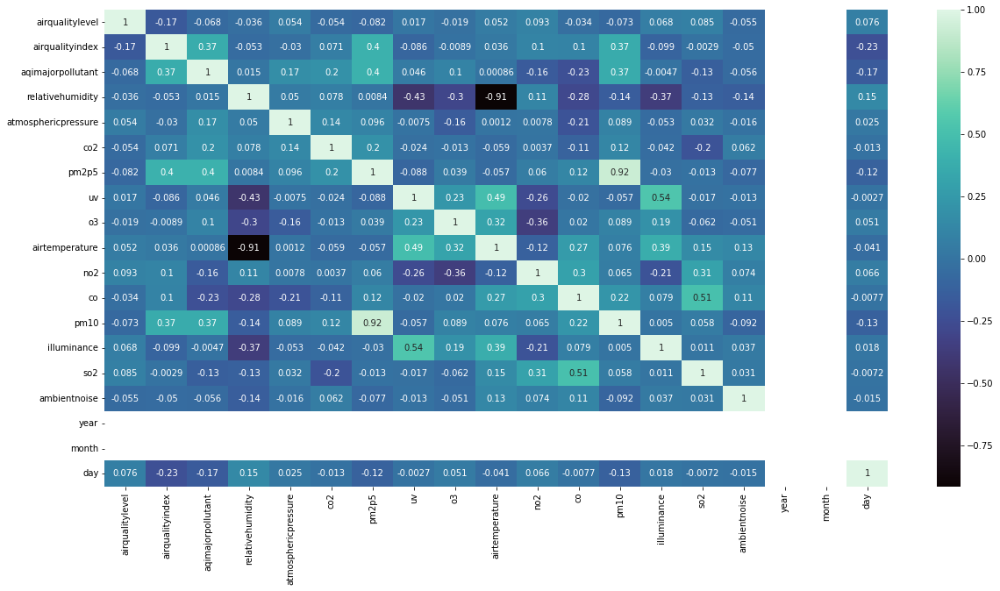

In [58]:
plt.figure(figsize=(20,10))
sns.heatmap(pollution_data.corr(),annot=True, cmap='mako')
plt.show()

Let's first understand the heatmap the darker the colour the less the correlation between those columns the lighter the colour the more the correlation.

from above we can see that 
1) airqualitylevel have negative correlation means 1 unit increase in airquality there is going to
{-0.062 ambientnoice,-0.081 Pm10,-0.048 co,-0.028 o3,-0.091 pm2p5,-0.066 co2,-0.038 airmajorpollutant,-0.029 relativehumidity,-0.19 airqualityindex} unit decrease in particular values and also airqualitylevel is positivily correlated means 1 unit increase in airqualitylevel there is going to {0.11 day,0.095 so2, 0.063 illuminance,0.1 no2, 0.058 airtempreture, 0.019 Uv,0.067 atmoshpericpressure} unit increase in these column values.

like this every column is negativily and positively correlated with each other.

2)Let's take airqualityindex column it is negatively correlated with ambientnoice ,So2,illuminance,uv,atmosphericpressure, relativehumidity and airqualitylevel mean 1unit increase in airqualitylevel thereis going to be decrease in these values and vice versa.airqualityindex column is positively correlated with Pm10,co,no2,airtemprature,o3,pm2p5,co2,aqimajorairpollutant.

it's like this for every column .....


let us visualize highly positively correlated column  For that i am going to perfrom the bivariate analysis on the pollutanat data.

In [59]:
def correlation_plot(a1,b1):
  plt.figure(figsize=(20,3),dpi=100)
  sns.lineplot(data=pollution_data, x=a1, y=b1)
  plt.show()


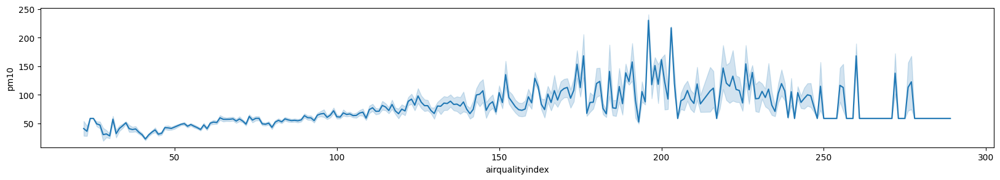

In [60]:
correlation_plot("airqualityindex","pm10")

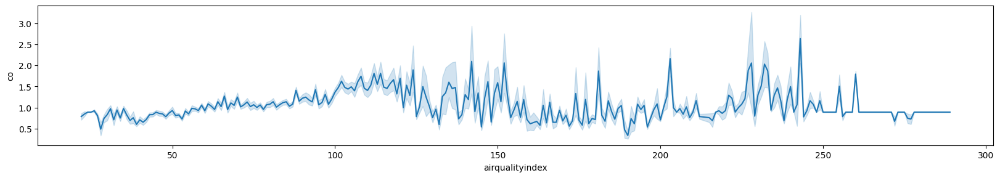

In [61]:
correlation_plot("airqualityindex","co")

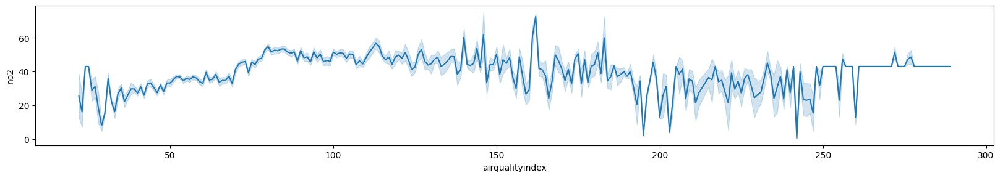

In [62]:
correlation_plot("airqualityindex","no2")

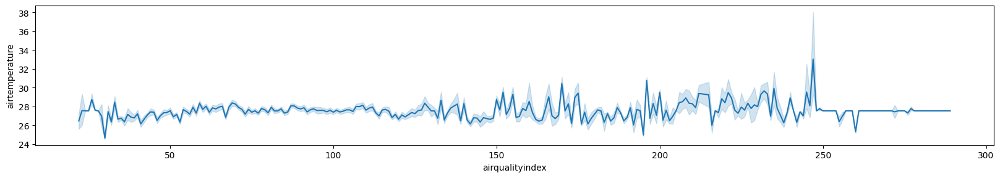

In [63]:
correlation_plot("airqualityindex","airtemperature")

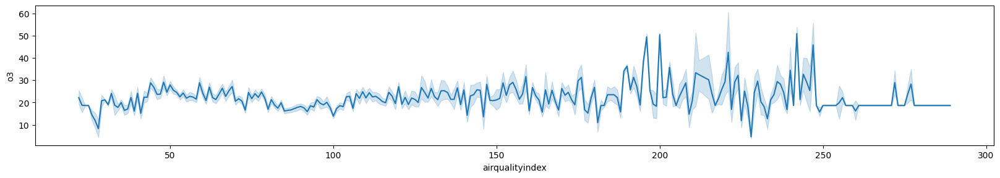

In [64]:
correlation_plot("airqualityindex","o3")

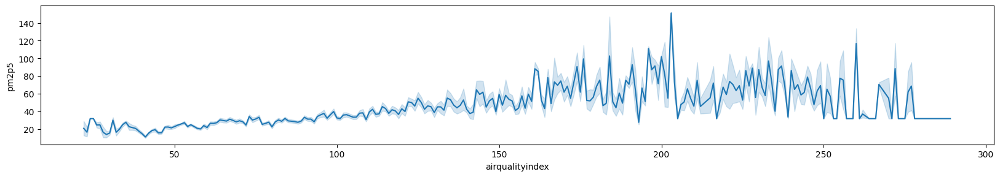

In [65]:
correlation_plot("airqualityindex","pm2p5")

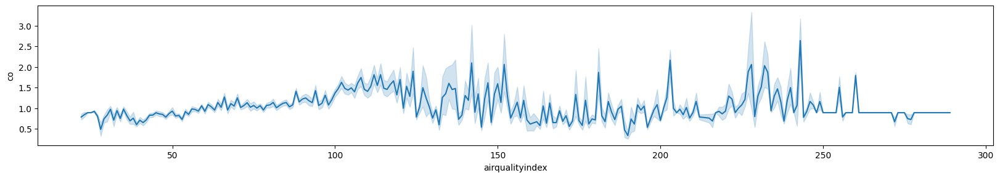

In [66]:
correlation_plot("airqualityindex","co")

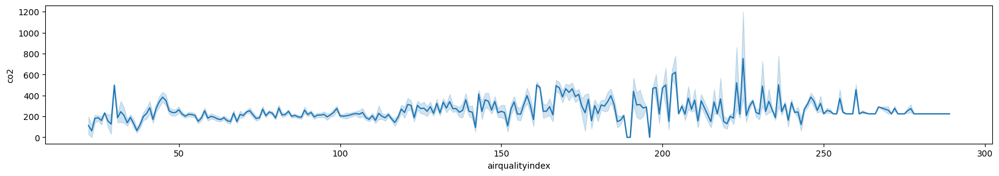

In [67]:
correlation_plot("airqualityindex","co2")

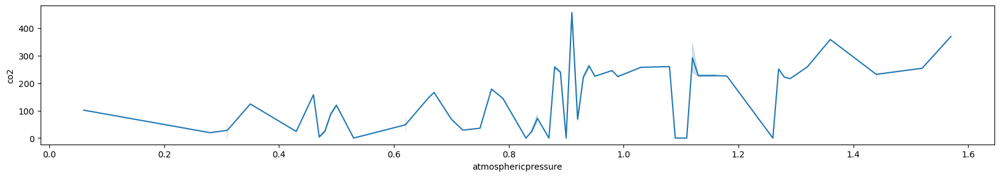

In [ ]:
correlation_plot("atmosphericpressure","co2")

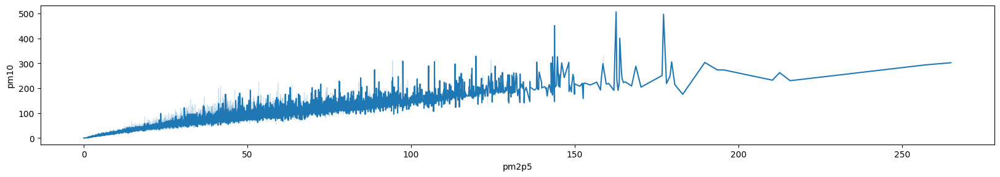

In [ ]:
correlation_plot("pm2p5","pm10")

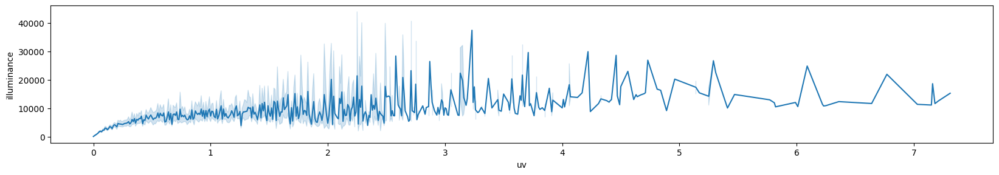

In [ ]:
correlation_plot("uv","illuminance")

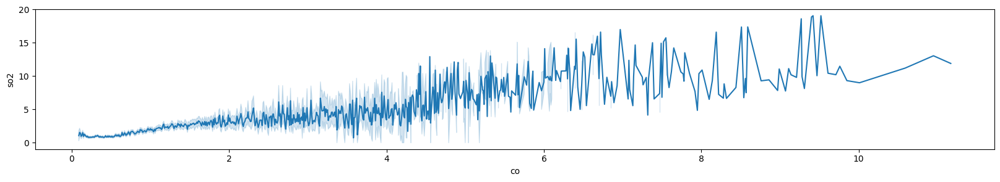

In [ ]:
correlation_plot("co","so2")

# (4) Time series forecasting problem

For forecasting i am using Co and dattime column

In [69]:
#making copy of the some columns 
df_timeSeries=pollution_data[["DateTime","co"]].copy()

In [70]:
df_timeSeries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31266 entries, 0 to 31265
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   DateTime  31266 non-null  object 
 1   co        31266 non-null  float64
dtypes: float64(1), object(1)
memory usage: 488.7+ KB


In [71]:
df_timeSeries["DateTime"]=pd.to_datetime(df_timeSeries["DateTime"])


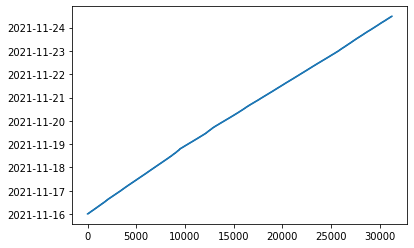

In [72]:
df_timeSeries["DateTime"].plot()

In [73]:
df_timeSeries = df_timeSeries.rename(columns={'DateTime': 'ds', 'co': 'y'})

In [74]:
from sklearn import metrics
from fbprophet import Prophet

FbProphet is a powerful time series analysis package released by Core Data Science Team at Facebook. It is simple and easy to go package for performing time series analytics and forecasting at scale.

In [75]:
#splitting the data
validate = df_timeSeries[['ds','y']].tail(100)

df_timeSeries.drop(df_timeSeries[['ds','y']].tail(100).index,inplace=True)

train = df_timeSeries[['ds','y']]


In [77]:
#creating model object
m = Prophet(yearly_seasonality=False)

In [78]:
#Fitting the model
m.fit(train)
p = 100
future = m.make_future_dataframe(periods=p,freq='H',include_history=False)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.


In [79]:
future

,ds
0,2021-11-24 12:11:45
1,2021-11-24 13:11:45
2,2021-11-24 14:11:45
3,2021-11-24 15:11:45
4,2021-11-24 16:11:45
...,...
95,2021-11-28 11:11:45
96,2021-11-28 12:11:45
97,2021-11-28 13:11:45
98,2021-11-28 14:11:45


In [80]:
#the model is going to predict the value for these future day on hourly basses
forecast = m.predict(future)

In [81]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-11-24 12:11:45,1.312475,0.473522,2.279464,1.312475,1.312475,0.051038,0.051038,0.051038,0.051038,0.051038,0.051038,0.0,0.0,0.0,1.363513
1,2021-11-24 13:11:45,1.317848,0.386349,2.324383,1.316210,1.321823,0.014406,0.014406,0.014406,0.014406,0.014406,0.014406,0.0,0.0,0.0,1.332254
2,2021-11-24 14:11:45,1.323221,0.326742,2.228662,1.312323,1.341793,-0.027312,-0.027312,-0.027312,-0.027312,-0.027312,-0.027312,0.0,0.0,0.0,1.295909
3,2021-11-24 15:11:45,1.328593,0.383966,2.266745,1.303203,1.361297,-0.056031,-0.056031,-0.056031,-0.056031,-0.056031,-0.056031,0.0,0.0,0.0,1.272562
4,2021-11-24 16:11:45,1.333966,0.414480,2.264474,1.289490,1.389838,-0.011524,-0.011524,-0.011524,-0.011524,-0.011524,-0.011524,0.0,0.0,0.0,1.322443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2021-11-28 11:11:45,1.822885,-7.866150,11.867224,-7.952362,11.717956,0.087166,0.087166,0.087166,0.087166,0.087166,0.087166,0.0,0.0,0.0,1.910052
96,2021-11-28 12:11:45,1.828258,-8.236617,11.859394,-8.151923,11.874676,0.051038,0.051038,0.051038,0.051038,0.051038,0.051038,0.0,0.0,0.0,1.879296
97,2021-11-28 13:11:45,1.833631,-8.469177,11.746950,-8.164875,11.992934,0.014406,0.014406,0.014406,0.014406,0.014406,0.014406,0.0,0.0,0.0,1.848037
98,2021-11-28 14:11:45,1.839004,-8.348523,11.998855,-8.295402,12.099220,-0.027312,-0.027312,-0.027312,-0.027312,-0.027312,-0.027312,0.0,0.0,0.0,1.811692


In the above forecast the yhat value colum is the predicted value for co.other column like yhat_lowwer nad yhat-upper is the range for yhat and other columns statistically contribute in predicting the yhat value.you can see the ds colum the time interval is 1hr between them so basically here it is predicting hour values for CO.

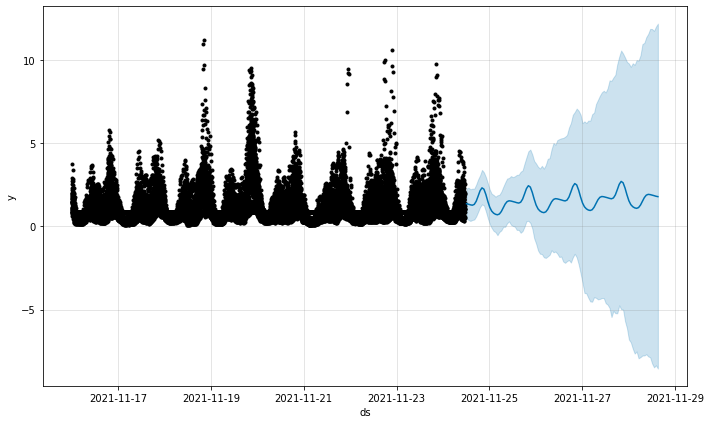

In [82]:
#the predicted value graph
fig1 = m.plot(forecast)

The black dots indicate dthe original data and the blue curvilinear line indicate the predictionvalue and the light blue colur is the trend space for that particular prediction.

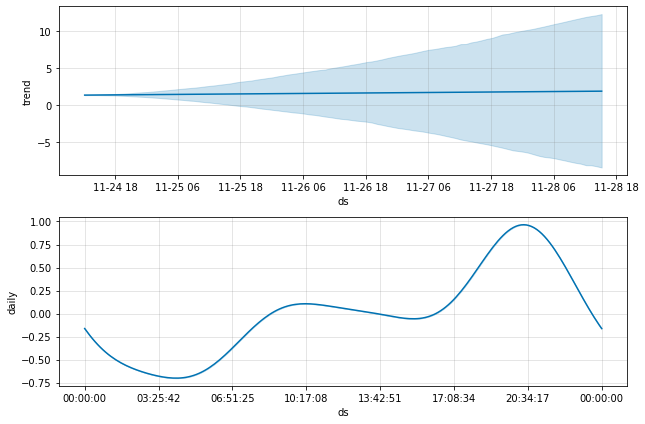

In [83]:
fig2 = m.plot_components(forecast)

here we can see the trend line and daily base line in daily we can see that how the values goes up by the time and goes down by the time.

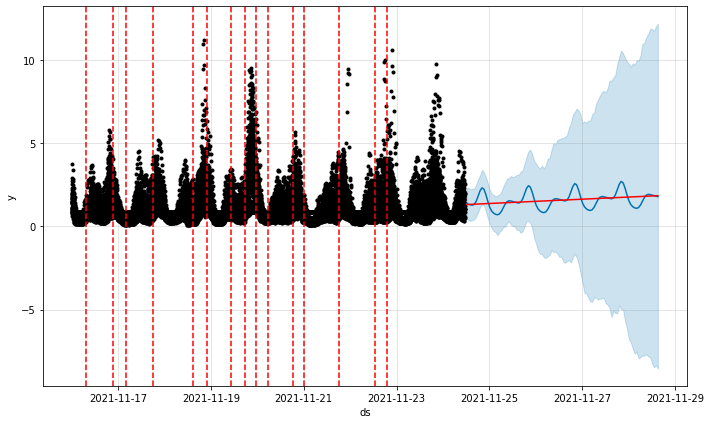

In [84]:
from fbprophet.plot import add_changepoints_to_plot
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

In this plot we can get that in the original data where is the change happening by  spaces between the red line and according to that we can also know about our predicted value also

In [85]:
def timeseries_evaluation_metrics_func(y_true, y_pred):
    
    def mean_absolute_percentage_error(y_true, y_pred): 
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    #print('Evaluation metric results:-')
    print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
    print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
    print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
    print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
    print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')

here i am validating the prediction value through the metrics as we had teh continuos datetime we cant not check through actual and predicted value but we can check through these metrics value .and the main is the RMSE value if it is low then our model is doing fine job.

In [86]:
validation=timeseries_evaluation_metrics_func(validate.y,forecast.yhat)

MSE is : 0.75075833647576
MAE is : 0.7101039196995075
RMSE is : 0.8664631189356878
MAPE is : 92.71008858085952
R2 is : -1.580821658749691



AS the RMSE value is less we can say that our model is doing a fine job in forecasting.

In [87]:
c=pollution_data["co"].tail(100)
c

31166    2.92
31167    0.89
31168    0.89
31169    1.08
31170    0.89
         ... 
31261    1.03
31262    0.81
31263    1.05
31264    0.89
31265    0.60
Name: co, Length: 100, dtype: float64

As we can see in the main data also the value for co is in 0 -1-2-3 in these range 

In [88]:
forecast.yhat


0     1.363513
1     1.332254
2     1.295909
3     1.272562
4     1.322443
        ...   
95    1.910052
96    1.879296
97    1.848037
98    1.811692
99    1.788345
Name: yhat, Length: 100, dtype: float64

And the predicted values are also in that range only not  100% accurate but yes it is doing good job.